In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from quantumnetworks import SingleModeSystem, plot_full_evolution, animate_evolution, DoubleModeSystem, MultiModeSystem
import numpy as np

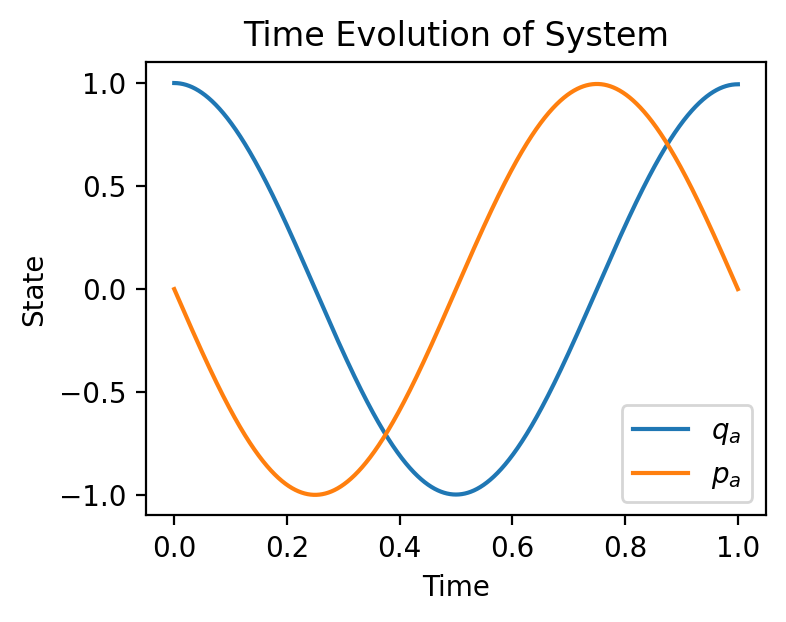

In [3]:
A_in = lambda t: 0
sys = SingleModeSystem(params={"omega_a": 2*np.pi*1, "kappa_a": 0, "kerr_a":0}, A_in = A_in)
x_0 = np.array([1,0])
ts = np.linspace(0, 1, 100001)
X = sys.forward_euler(x_0, ts)
fig, ax = plot_full_evolution(X, ts, labels=["$q_a$","$p_a$"])
ax.legend()

In [4]:
fig, ax = animate_evolution(X,ts, num_frames=100, animation_time=1)

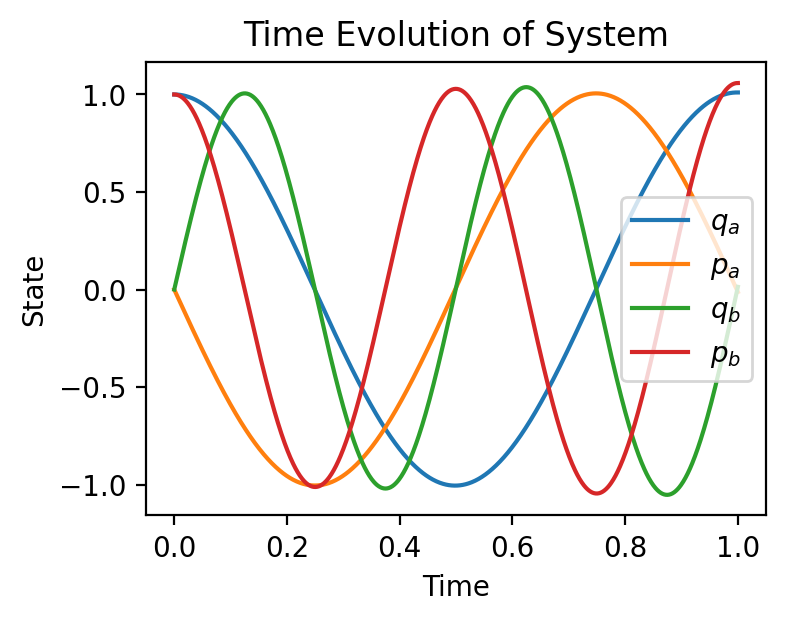

In [5]:
sys = DoubleModeSystem(params={})
x_0_2 = np.array([1,0,0,1])
ts2 = np.linspace(0, 1, 1001)
X2 = sys.forward_euler(x_0_2, ts2)
labels = ["$q_a$","$p_a$","$q_b$","$p_b$"]
fig, ax = plot_full_evolution(X2, ts2, labels=labels)
_ = ax.legend()

In [6]:
fig, axs = animate_evolution(X2,ts2, labels=labels, num_frames=100, animation_time=2)

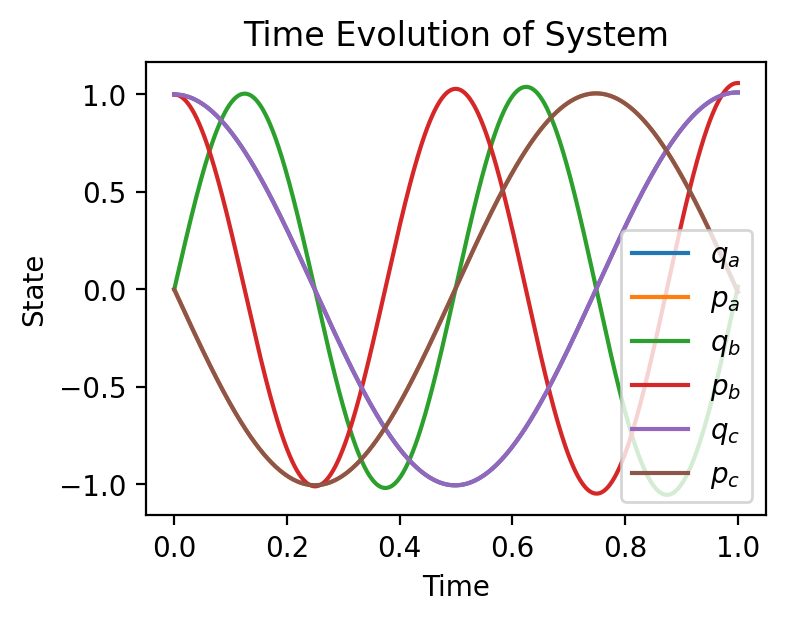

In [18]:
omegas = [2*np.pi*1,2*np.pi*2,2*np.pi*1]
kappas = [2*np.pi*0.001,2*np.pi*0.005,2*np.pi*0.001]
gammas = [2*np.pi*0.002,2*np.pi*0.002,2*np.pi*0.002]
kerrs = [2*np.pi*0.001, 2*np.pi*0.001, 2*np.pi*0.001]
couplings = [[0,1,2*np.pi*0.002],[1,2,2*np.pi*0.002]]
sys = MultiModeSystem(params={"omegas":omegas, "kappas":kappas, "gammas":gammas, "kerrs":kerrs, "couplings":couplings})

x_0 = np.array([1,0, 0,1, 1,0])
ts = np.linspace(0, 1, 1001)
X = sys.forward_euler(x_0, ts)
labels = ["$q_a$","$p_a$", "$q_b$","$p_b$", "$q_c$","$p_c$"]
fig, ax = plot_full_evolution(X, ts, labels=labels)
ax.legend()

In [19]:
fig, axs = animate_evolution(X,ts, labels=labels, num_frames=100, animation_time=2)

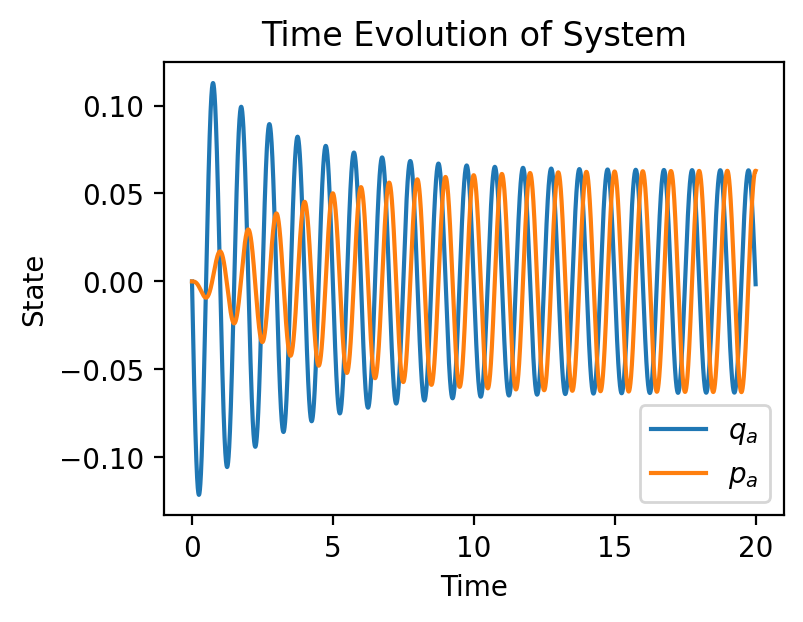

In [4]:
# ramp up on resonance
omega_a = 2*np.pi*1
delta = 2*np.pi*0.0
A_in = lambda t: np.exp(1j*(omega_a +delta)*t) #default A_in is used
sys = SingleModeSystem(params={"omega_a": omega_a, "kappa_a": 2*np.pi*0.1}, A_in = A_in)
x_0 = np.array([0,0])
ts = np.linspace(0, 20, 100001)
X = sys.forward_euler(x_0, ts)
X[1,:] = X[1,:] 
fig, ax = plot_full_evolution(X, ts, labels=["$q_a$","$p_a$"])
ax.legend()

In [7]:
fig, axs = animate_evolution(X,ts, num_frames=1000, animation_time=2)